In [4]:
# !unzip 'drive/MyDrive/dog breed id/dog-breed-identification.zip' -d 'drive/MyDrive/dog breed id'

In [5]:
import tensorflow as tf
import tensorflow_hub as hub

print('ok' if tf.config.list_physical_devices('GPU') else 'not ok')

ok


In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

labels_csv=pd.read_csv('drive/MyDrive/dog breed id/labels.csv')
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


<Axes: xlabel='breed'>

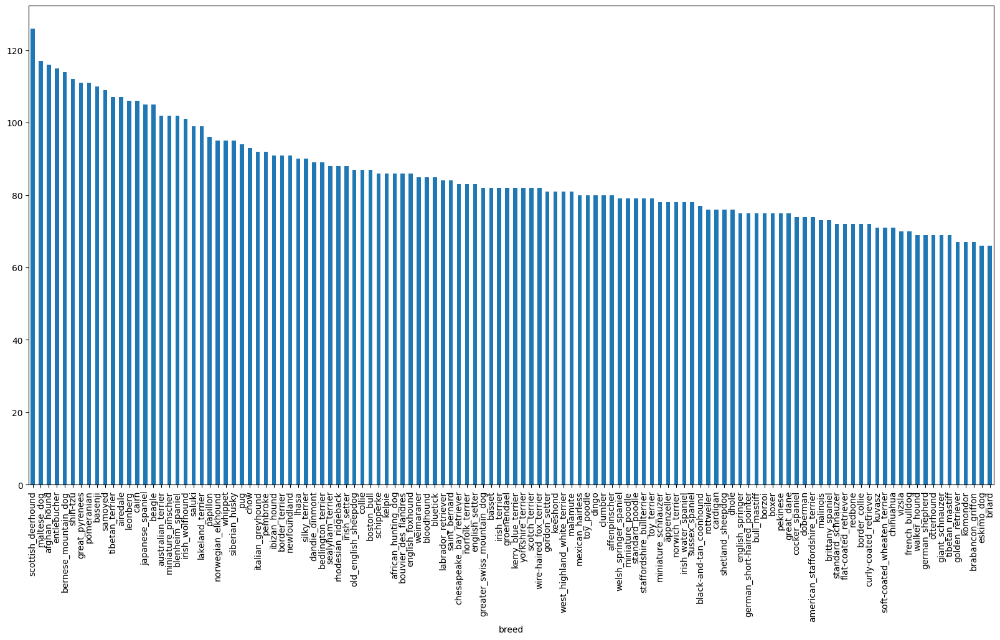

In [7]:
labels_csv['breed'].value_counts().plot(figsize=(20,10),kind='bar')

In [8]:
labels_csv['breed'].value_counts().median()

82.0

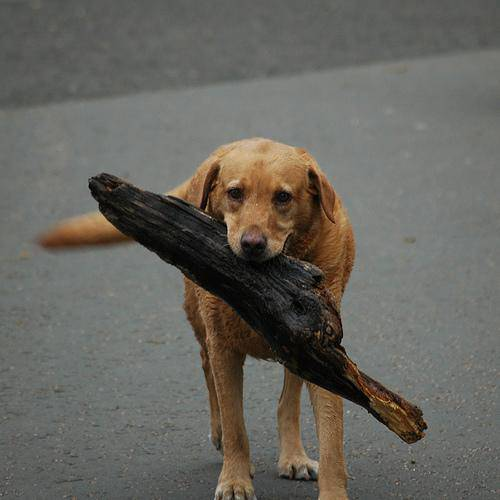

In [9]:
from IPython.display import Image

Image('drive/MyDrive/dog breed id/train/0021f9ceb3235effd7fcde7f7538ed62.jpg')

In [10]:
filenames=['drive/MyDrive/dog breed id/train/'+ fname +'.jpg' for fname in labels_csv['id']]

filenames[:10]

['drive/MyDrive/dog breed id/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/dog breed id/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/dog breed id/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/dog breed id/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/dog breed id/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/dog breed id/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/dog breed id/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/dog breed id/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/dog breed id/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/dog breed id/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [11]:
import os

if len(os.listdir('drive/MyDrive/dog breed id/train'))==len(filenames):
  print('ok')
else:
  prnit('not ok')

ok


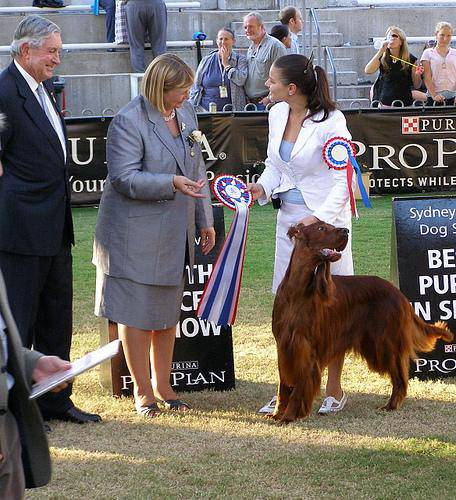

In [12]:
Image(filenames[2137])

In [13]:
labels_csv['breed'][2137]

'irish_setter'

In [14]:
labels=labels_csv['breed']
labels=np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [15]:
len(labels)

10222

In [16]:
if len(labels)==len(filenames):
  print('ok')
else:
  prnit('not ok')

ok


In [17]:
unique_breeds=np.unique(labels)
len(unique_breeds)

120

In [18]:
boolean_labels=[label==unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [19]:
X=filenames
y=boolean_labels

In [20]:
num_images=1000 #@param {type:'slider',min:1000,max:10000,step:1000}

In [21]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:num_images],
                                                  y[:num_images],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [22]:
X_train[:2],y_train[:2]

(['drive/MyDrive/dog breed id/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/dog breed id/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False,

In [23]:
image=plt.imread(filenames[42])
image.shape

(257, 350, 3)

In [24]:
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

In [25]:
IMG_SIZE=224

def process_image(image_path, img_size=IMG_SIZE):
  image=tf.io.read_file(image_path)
  image=tf.image.decode_jpeg(image,channels=3)
  image=tf.image.convert_image_dtype(image,tf.float32)
  image=tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])

  return image


In [26]:
def get_image_label(image_path, label):
  image=process_image(image_path)

  return image, label

In [27]:
(process_image(X[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [28]:
BATCH_SIZE=32

def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  if test_data:
    print('creating test data batches')
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch=data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  elif valid_data:
    print('creating validation data batches')
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                             tf.constant(y)))
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print('creating training data batches')
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                             tf.constant(y)))
    data=data.shuffle(buffer_size=len(X))
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

In [29]:
train_data=create_data_batches(X_train,y_train)
val_data=create_data_batches(X_val,y_val,valid_data=True)

creating training data batches
creating validation data batches


In [30]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [31]:
def show_25_images(images,labels):
  plt.figure(figsize=(10,10))
  for i in range(25):
    ax=plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis('off')

In [32]:
train_images,train_labels=next(train_data.as_numpy_iterator())

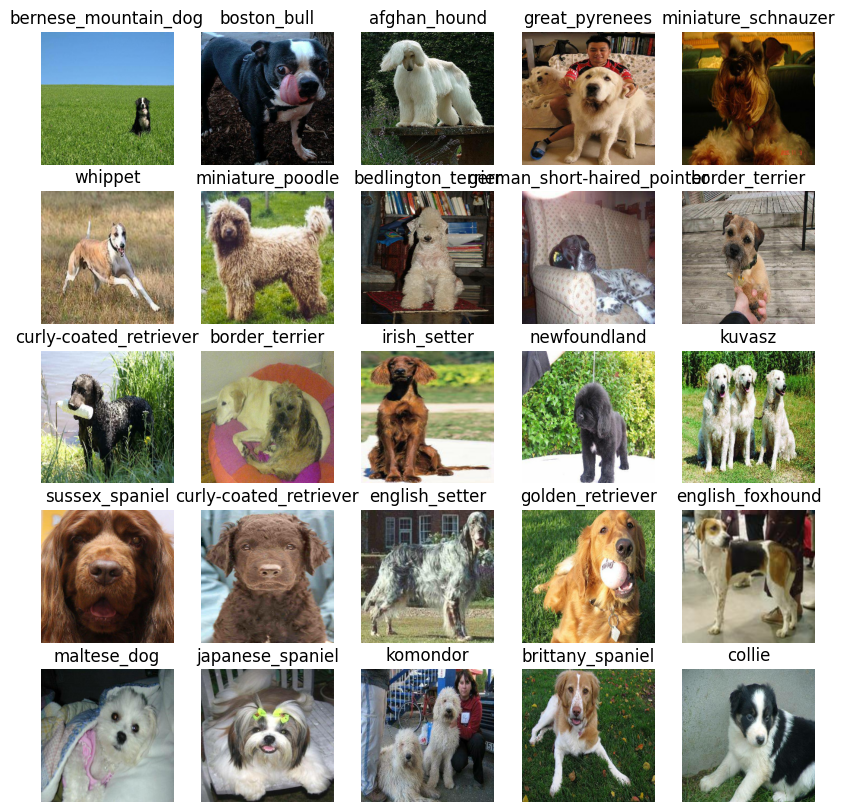

In [33]:
show_25_images(train_images,train_labels)

In [34]:
INPUT_SHAPE=[IMG_SIZE,IMG_SIZE,3]

OUTPUT_SHAPE=len(unique_breeds)

MODEL_PATH='drive/MyDrive/dog breed id/resnet-v2-tensorflow2-50-feature-vector-v2'

In [35]:
from keras.layers import TFSMLayer, Dense, Input
from tensorflow.keras import Model

def create_model(input_shape=(IMG_SIZE, IMG_SIZE, 3), output_shape=OUTPUT_SHAPE, model_path=MODEL_PATH):
    print("Building model with:", model_path)

    base_model = TFSMLayer(model_path, call_endpoint="serving_default", trainable=False)

    inputs = Input(shape=input_shape)
    features_dict = base_model(inputs)
    features = features_dict['feature_vector']

    outputs = Dense(output_shape, activation="softmax")(features)

    model = Model(inputs, outputs)

    model.compile(
        loss="categorical_crossentropy",
        optimizer="adam",
        metrics=["accuracy"]
    )

    return model

In [36]:
%load_ext tensorboard

In [37]:
model=create_model()
model.summary()

Building model with: drive/MyDrive/dog breed id/resnet-v2-tensorflow2-50-feature-vector-v2


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ tfsm_layer (TFSMLayer)          │ (None, 2048)           │    23,564,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 120)            │       245,880 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,810,680 (90.83 MB)

 Trainable params: 245,880 (960.47 KB)

 Non-trainable params: 23,564,800 (89.89 MB)

In [38]:
import datetime

def create_tensorboard_callback():
  logdir=os.path.join('drive/MyDrive/dog breed id/logs',
                      datetime.datetime.now().strftime('%H%M%S-%d%m%Y'))

  return tf.keras.callbacks.TensorBoard(logdir)

In [39]:
early_stopping=tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                               patience=3)

In [40]:
NUM_EPOCHS=5 #@param {type:'slider',min:5,max:100,step:5}

In [41]:
print('ok' if tf.config.list_physical_devices('GPU') else 'not ok')

ok


In [42]:
def train_model():
  model=create_model()

  tensorboard=create_tensorboard_callback()

  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  return model


In [ ]:
model=train_model()

Building model with: drive/MyDrive/dog breed id/resnet-v2-tensorflow2-50-feature-vector-v2
Epoch 1/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 185s 7s/step - accuracy: 0.0578 - loss: 5.3097 - val_accuracy: 0.2500 - val_loss: 3.2009
Epoch 2/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 168s 7s/step - accuracy: 0.6376 - loss: 1.7052 - val_accuracy: 0.5150 - val_loss: 2.0642
Epoch 3/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 209s 7s/step - accuracy: 0.9402 - loss: 0.4878 - val_accuracy: 0.6000 - val_loss: 1.7320
Epoch 4/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 178s 7s/step - accuracy: 0.9897 - loss: 0.2374 - val_accuracy: 0.6300 - val_loss: 1.6127
Epoch 5/5
25/25 ━━━━━━━━━━━━━━━━━━━━ 200s 7s/step - accuracy: 0.9965 - loss: 0.1374 - val_accuracy: 0.6200 - val_loss: 1.6150


In [ ]:
MODEL_SAVE_PATH = 'drive/MyDrive/dog breed id/my_trained_model.keras'

model.save(MODEL_SAVE_PATH)
print('model saved at:', MODEL_SAVE_PATH)

model saved at: drive/MyDrive/dog breed id/my_trained_model.keras


In [ ]:
%tensorboard --logdir drive/MyDrive/dog\ breed\ id/logs

<IPython.core.display.Javascript object>

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [58]:
predictions=model.predict(val_data,verbose=1)
predictions

7/7 ━━━━━━━━━━━━━━━━━━━━ 84s 11s/step


array([[0.00086993, 0.01034159, 0.00286192, ..., 0.01165135, 0.00287734,
        0.00676299],
       [0.00093244, 0.00130729, 0.00047419, ..., 0.0028678 , 0.00360782,
        0.01212382],
       [0.00109135, 0.02578114, 0.00254059, ..., 0.00029977, 0.00377529,
        0.00643902],
       ...,
       [0.01087748, 0.00041733, 0.00759959, ..., 0.00066421, 0.00516697,
        0.00350729],
       [0.00968516, 0.06628762, 0.00422874, ..., 0.00644757, 0.00090707,
        0.00766303],
       [0.00560494, 0.00166225, 0.00104456, ..., 0.00887826, 0.00138063,
        0.00083975]], dtype=float32)

In [ ]:
index=0
print(predictions[index])
print(f'max value (probability of prediction): {np.max(predictions[index])}')
print(f'Sum: {np.sum(predictions[index])}')
print(f'Max index: {np.argmax(predictions[index])}')
print(f'Predicted label: {unique_breeds[np.argmax(predictions[index])]}')

[1.33495091e-03 6.52315968e-04 1.68893108e-04 9.47685097e-04
 8.62718662e-05 2.61259152e-06 6.07340457e-03 1.69306186e-05
 6.04463276e-04 1.54330955e-05 1.01889099e-03 4.81187890e-05
 4.48889987e-05 2.37727345e-05 3.49871043e-05 4.97759029e-05
 3.63083382e-06 1.11562433e-02 5.29977951e-05 6.66568621e-06
 2.37151957e-03 2.26394077e-05 3.19471042e-06 1.05736349e-02
 4.78948868e-06 4.93737048e-07 2.68492643e-02 3.31560004e-05
 1.17755699e-04 6.45143678e-04 3.04581736e-05 7.42727949e-04
 3.74606207e-05 4.19943353e-05 3.43438034e-04 3.55466502e-03
 3.25215296e-05 6.83373219e-05 6.47476952e-07 3.72976756e-05
 1.82990497e-03 2.70638884e-06 1.43261855e-06 2.69397824e-05
 7.90842762e-07 1.74999092e-04 6.71998441e-06 5.01723298e-05
 2.27383891e-04 9.71048794e-05 2.66821262e-05 3.22470820e-04
 3.66188562e-03 1.81580390e-06 4.13745911e-05 5.01863440e-07
 1.10267074e-05 6.16036076e-03 1.83228003e-05 6.87497184e-02
 1.71764532e-05 1.45929616e-05 7.44027056e-05 1.36066054e-04
 5.91541648e-05 1.949984

In [59]:
def get_pred_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]

pred_label=get_pred_label(predictions[0])
pred_label

'malinois'

In [60]:
def unbatchify(data):
  images=[]
  labels=[]

  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels

val_images, val_labels=unbatchify(val_data)
val_images[0],val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_labels[0])

'affenpinscher'

In [ ]:
images_=[]
labels_=[]

for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0],labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(labels_[0])

'cairn'

In [ ]:
get_pred_label(predictions[0])

'lakeland_terrier'

In [61]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  pred_label = get_pred_label(pred_prob)

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if pred_label==true_label:
    color='green'
  else:
    color='red'

  plt.title('{} {:2.0f}% {}'.format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
            color=color)

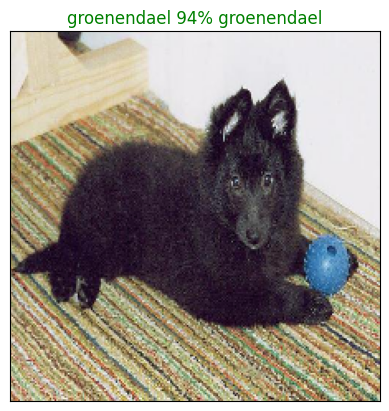

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

In [62]:
def plot_pred_conf(prediction_probabilities,labels,n=1):
  pred_prob, true_label=prediction_probabilities[n], labels[n]

  pred_label=get_pred_label(pred_prob)

  top_10_pred_indexes=pred_prob.argsort()[-10:][::-1]
  top_10_pred_values=pred_prob[top_10_pred_indexes]
  top_10_pred_labels=unique_breeds[top_10_pred_indexes]

  top_plot=plt.bar(np.arange(len(top_10_pred_labels)),
                   top_10_pred_values,
                   color='grey')
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation='vertical')

  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels==true_label)].set_color('green')
  else:
    pass

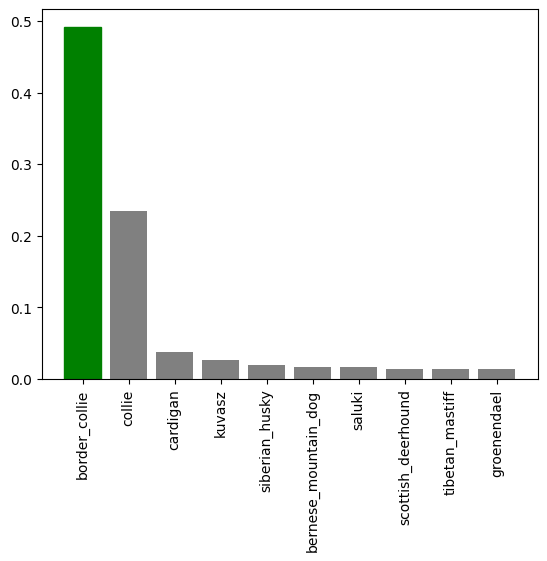

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,labels=val_labels,n=9)

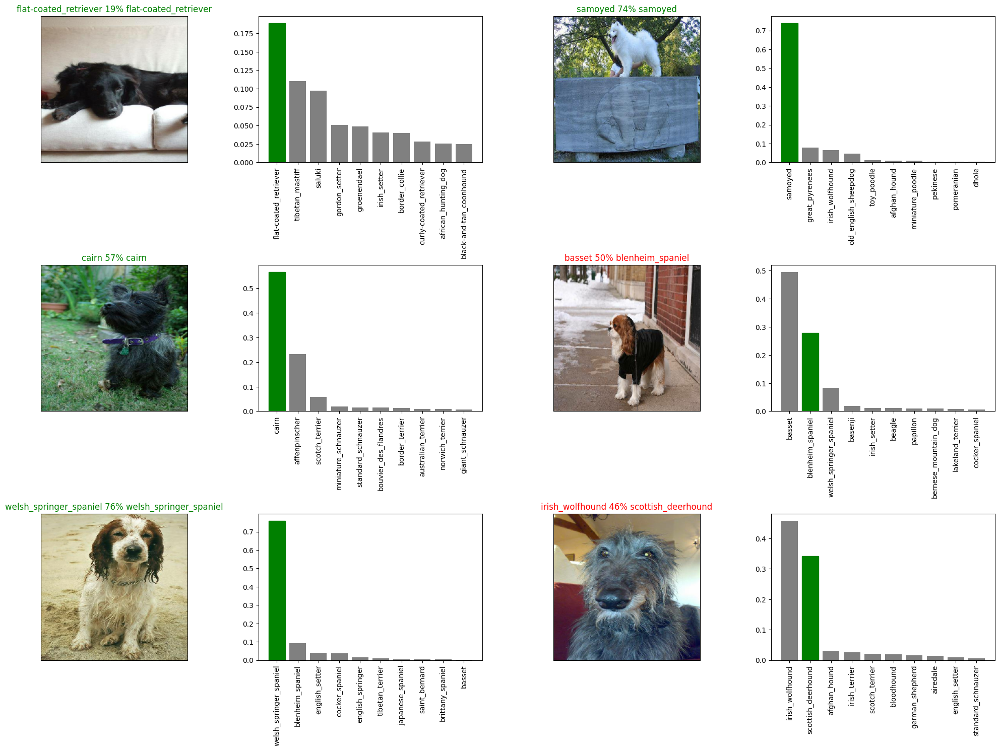

In [ ]:
i_multiplier=20
num_rows=3
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [46]:
def save_model(model, suffix=None):
  modeldir=os.path.join('drive/MyDrive/dog breed id/models',
                        datetime.datetime.now().strftime('%H%M%S-%d%m%Y'))
  model_path=modeldir+'-'+suffix+'.keras'
  print(f'saving model to: {model_path}')
  model.save(model_path)
  return model_path

In [47]:
def load_model(model_path):
  print(f'loading saved model from: {model_path}')
  model=tf.keras.models.load_model(model_path,
                                   custom_objects={'KerasLayer':hub.KerasLayer})
  return model

In [ ]:
save_model(model,suffix='1000-images-resnetv2-Adam')


saving model to: drive/MyDrive/dog breed id/models/143247-27082025-1000-images-resnetv2-Adam.keras


'drive/MyDrive/dog breed id/models/143247-27082025-1000-images-resnetv2-Adam.keras'

In [ ]:
loaded_1000_image_model=load_model('drive/MyDrive/dog breed id/models/143247-27082025-1000-images-resnetv2-Adam.keras')

loading saved model from: drive/MyDrive/dog breed id/models/143247-27082025-1000-images-resnetv2-Adam.keras


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 4 variables whereas the saved optimizer has 6 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [ ]:
model.evaluate(val_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 48s 7s/step - accuracy: 0.6279 - loss: 1.5000


[1.6150333881378174, 0.6200000047683716]

In [ ]:
loaded_1000_image_model.evaluate(val_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 37s 5s/step - accuracy: 0.6279 - loss: 1.5000


[1.6150333881378174, 0.6200000047683716]

In [ ]:
len(X),len(y)

(10222, 10222)

In [ ]:
full_data=create_data_batches(X,y)

creating training data batches


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
full_model=create_model()

Building model with: drive/MyDrive/dog breed id/resnet-v2-tensorflow2-50-feature-vector-v2


In [ ]:
full_model_tensorboard=create_tensorboard_callback()
full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                           patience=3)

In [ ]:
full_model.fit(x=full_data,
               epochs=5,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/5
320/320 ━━━━━━━━━━━━━━━━━━━━ 1779s 6s/step - accuracy: 0.9855 - loss: 0.0919
Epoch 2/5
320/320 ━━━━━━━━━━━━━━━━━━━━ 1752s 5s/step - accuracy: 0.9937 - loss: 0.0657
Epoch 3/5
320/320 ━━━━━━━━━━━━━━━━━━━━ 1765s 5s/step - accuracy: 0.9977 - loss: 0.0479
Epoch 4/5
320/320 ━━━━━━━━━━━━━━━━━━━━ 1766s 5s/step - accuracy: 0.9975 - loss: 0.0408
Epoch 5/5
320/320 ━━━━━━━━━━━━━━━━━━━━ 1792s 6s/step - accuracy: 0.9986 - loss: 0.0323


In [ ]:
save_model(full_model,suffix='full-image-set-resnetv2-Adam')

saving model to: drive/MyDrive/dog breed id/models/194834-27082025-full-resnetv2-Adam.keras


'drive/MyDrive/dog breed id/models/194834-27082025-full-resnetv2-Adam.keras'

In [48]:
loaded_full_model=load_model('drive/MyDrive/dog breed id/models/194834-27082025-full-resnetv2-Adam.keras')

loading saved model from: drive/MyDrive/dog breed id/models/194834-27082025-full-resnetv2-Adam.keras


In [ ]:
test_path='drive/MyDrive/dog breed id/test/'
test_filenames=[test_path+fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/dog breed id/test/e3d417026b89cbb57b00a7208421009d.jpg',
 'drive/MyDrive/dog breed id/test/df69bb4b3dbdc81541e2bd70a5f35cb1.jpg',
 'drive/MyDrive/dog breed id/test/de85fdcf74dbe025b9b89819735cb9bc.jpg',
 'drive/MyDrive/dog breed id/test/e27567e188000db387977cdb9bbdcf82.jpg',
 'drive/MyDrive/dog breed id/test/e5b43e17eb88bc5e2d6e9d1d04c01a5a.jpg',
 'drive/MyDrive/dog breed id/test/e3982348ad8b974cef2298f741bc3c99.jpg',
 'drive/MyDrive/dog breed id/test/e219af838e1d6a18224eb9b478944778.jpg',
 'drive/MyDrive/dog breed id/test/e6326f6c8ad1e06c0f70546ddfc64067.jpg',
 'drive/MyDrive/dog breed id/test/de93f567cf5830e982182435db086b93.jpg',
 'drive/MyDrive/dog breed id/test/dcb5d319bd013bbfa9779d8c6c11a829.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
test_data=create_data_batches(test_filenames, test_data=True)

creating test data batches


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
test_predictions=loaded_full_model.predict(test_data,
                                          verbose=1)

324/324 ━━━━━━━━━━━━━━━━━━━━ 2184s 7s/step


In [ ]:
np.savetxt('drive/MyDrive/dog breed id/preds_array.csv', test_predictions, delimiter=',')

In [ ]:
test_predictions=np.loadtxt('drive/MyDrive/dog breed id/preds_array.csv',delimiter=',')

In [ ]:
test_predictions[:10]

array([[2.29427588e-12, 1.35113529e-04, 6.48484599e-09, ...,
        5.44513000e-07, 7.52735048e-08, 3.85987353e-10],
       [4.61140317e-08, 1.29642796e-09, 2.76003060e-08, ...,
        9.71879786e-07, 5.83801363e-09, 1.34951303e-08],
       [3.85016347e-06, 3.86305793e-10, 5.47229021e-04, ...,
        1.12740451e-03, 3.80635311e-06, 1.33937235e-07],
       ...,
       [7.56601359e-09, 9.42625478e-03, 2.55439681e-06, ...,
        3.44430469e-03, 2.33129995e-05, 1.40433782e-04],
       [1.28476323e-08, 2.53140044e-11, 1.04125319e-11, ...,
        4.71225015e-08, 4.42775432e-04, 3.27370269e-03],
       [7.63471562e-08, 1.97776571e-05, 8.48441744e-07, ...,
        7.17807751e-08, 1.86172656e-06, 3.44555770e-06]])

In [ ]:
test_predictions.shape

(10357, 120)

In [ ]:
preds_df=pd.DataFrame(columns=['id']+list(unique_breeds))

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
test_ids=[os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df['id']=test_ids

In [ ]:
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e3d417026b89cbb57b00a7208421009d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,df69bb4b3dbdc81541e2bd70a5f35cb1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,de85fdcf74dbe025b9b89819735cb9bc,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e27567e188000db387977cdb9bbdcf82,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e5b43e17eb88bc5e2d6e9d1d04c01a5a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10352,085ee840fecbb0fc74d69d7d8858ebf4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10353,078a52db2d156257696c771487a6a316,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10354,07d94fdf5371753b114f7ce7505d0fe2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10355,082d768e587edd63163873ecf146de0b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
preds_df[list(unique_breeds)]=test_predictions
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e3d417026b89cbb57b00a7208421009d,2.294276e-12,1.351135e-04,6.484846e-09,1.016011e-09,9.984184e-12,8.261426e-11,3.426703e-10,3.263222e-10,4.105907e-10,...,1.340982e-11,1.882661e-08,3.934493e-14,2.951138e-09,6.251295e-11,7.974713e-10,5.179149e-10,5.445130e-07,7.527350e-08,3.859874e-10
1,df69bb4b3dbdc81541e2bd70a5f35cb1,4.611403e-08,1.296428e-09,2.760031e-08,2.092863e-09,5.243056e-06,2.847264e-03,4.040759e-07,6.678167e-05,3.339407e-07,...,2.295602e-09,7.261983e-08,4.209977e-10,3.486158e-05,1.356731e-07,8.906630e-09,3.009784e-07,9.718798e-07,5.838014e-09,1.349513e-08
2,de85fdcf74dbe025b9b89819735cb9bc,3.850163e-06,3.863058e-10,5.472290e-04,4.591323e-05,2.161376e-04,1.105751e-06,1.581633e-05,1.840093e-04,1.536687e-08,...,3.617175e-07,3.754599e-04,8.134911e-09,2.303490e-08,3.901394e-05,4.705491e-07,2.664623e-05,1.127405e-03,3.806353e-06,1.339372e-07
3,e27567e188000db387977cdb9bbdcf82,1.349794e-10,1.221334e-10,2.485333e-10,4.370894e-12,7.293903e-09,1.730055e-07,3.961146e-08,3.408855e-04,1.246852e-09,...,8.285685e-10,4.296757e-08,4.473397e-11,2.058917e-10,1.471171e-11,2.573781e-10,3.131145e-09,1.727994e-07,7.742378e-08,7.630427e-09
4,e5b43e17eb88bc5e2d6e9d1d04c01a5a,6.345896e-09,7.362102e-08,8.332702e-06,1.071569e-06,1.021257e-06,8.994864e-11,1.690396e-05,1.624281e-06,1.805607e-08,...,5.065591e-08,2.822002e-05,5.541719e-12,1.072829e-11,3.004422e-10,1.264962e-09,3.635132e-08,3.258204e-04,3.545808e-08,2.636010e-07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10352,085ee840fecbb0fc74d69d7d8858ebf4,1.727852e-08,1.405971e-09,7.705653e-08,1.628401e-08,4.135025e-07,5.992485e-01,2.747751e-07,2.550123e-05,4.819314e-07,...,1.528216e-08,3.601521e-06,1.706636e-10,3.010218e-05,1.017723e-07,1.323359e-07,2.593840e-06,1.592360e-05,5.648059e-08,7.081956e-08
10353,078a52db2d156257696c771487a6a316,4.096646e-09,2.584911e-08,3.597221e-09,5.996076e-05,5.247991e-09,7.241175e-08,2.202702e-06,2.699315e-07,3.058144e-09,...,9.420170e-05,1.451332e-04,5.629274e-09,3.004866e-07,9.361125e-09,3.699480e-09,1.073843e-04,1.075518e-07,1.517344e-01,8.035310e-06
10354,07d94fdf5371753b114f7ce7505d0fe2,1.499284e-08,1.610075e-08,6.491657e-09,2.766181e-05,2.391592e-10,6.455236e-08,1.275974e-07,1.500869e-08,2.925935e-09,...,2.814995e-06,5.775082e-07,3.370231e-09,4.557742e-08,3.439765e-09,2.474480e-10,1.531499e-04,2.500978e-08,3.573458e-01,2.795300e-06
10355,082d768e587edd63163873ecf146de0b,1.081277e-13,8.487656e-11,1.044071e-10,9.997711e-01,3.129099e-11,9.399495e-11,6.744026e-11,4.927769e-12,4.138176e-12,...,1.552045e-11,4.872740e-11,3.969116e-12,1.214463e-11,1.302954e-09,1.957032e-10,1.780503e-13,1.303520e-10,1.402478e-05,9.223460e-11


In [ ]:
preds_df.to_csv('drive/MyDrive/dog breed id/full_model_predictions_resnetv2_1.csv',
                index=False)

Done. Now testing it on the images of some random doggos I took when I was riding the bus

In [53]:
custom_path='drive/MyDrive/dog breed id/my-dog-photos/'
custom_image_paths=[custom_path + fname for fname in os.listdir(custom_path)]
custom_image_paths

['drive/MyDrive/dog breed id/my-dog-photos/20250227_181744.jpg',
 'drive/MyDrive/dog breed id/my-dog-photos/Messenger_creation_c948db3f-6454-44de-8e59-5b0c9cce7c2e.jpeg']

In [54]:
custom_data=create_data_batches(custom_image_paths, test_data=True)
custom_data

creating test data batches


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [55]:
custom_preds=loaded_full_model.predict(custom_data)
custom_preds.shape

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


(2, 120)

In [63]:
custom_pred_labels=[get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['sussex_spaniel', 'maltese_dog']

In [65]:
custom_images=[]
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

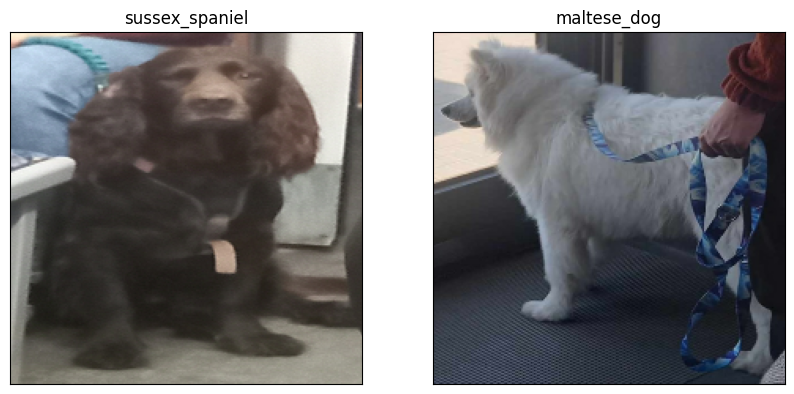

In [72]:
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1,2,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)